<a href="https://colab.research.google.com/github/Guiandreis/pneumonia_detection/blob/main/Gradcam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### IMPORT KAGGLE DATASET AND EXTRACT

In [1]:
!pip install -q kaggle

In [2]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"guilhermerandreis","key":"620b6777fb15a312ba23b9f0e9d6e286"}'}

In [3]:
! mkdir ~/.kaggle/

In [4]:
! cp kaggle.json ~/.kaggle/ 


In [5]:
! chmod 600 ~/.kaggle/kaggle.json

In [6]:
! kaggle datasets list

ref                                                       title                                               size  lastUpdated          downloadCount  voteCount  usabilityRating  
--------------------------------------------------------  -------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
ruchi798/data-science-job-salaries                        Data Science Job Salaries                            7KB  2022-06-15 08:59:12           5409        189  1.0              
surajjha101/bigbasket-entire-product-list-28k-datapoints  BigBasket Entire Product List (~28K datapoints)      6MB  2022-06-22 12:51:18           1619         78  1.0              
victorsoeiro/netflix-tv-shows-and-movies                  Netflix TV Shows and Movies                          2MB  2022-05-15 00:01:23          16199        472  1.0              
sameepvani/nasa-nearest-earth-objects                     NASA - Nearest Earth Objects         

In [7]:
!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia

100% 2.29G/2.29G [00:17<00:00, 130MB/s]
100% 2.29G/2.29G [00:17<00:00, 141MB/s]


In [8]:
import zipfile

In [9]:
path_to_zip_file = '/content/chest-xray-pneumonia.zip'
directory_to_extract_to = '/content/'
with zipfile.ZipFile(path_to_zip_file, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)

### IMPORTS

In [10]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [13]:
import pandas as pd
import numpy as np
import glob
import matplotlib.pyplot as plt
import zipfile
import cv2
import random
import os

from collections import defaultdict
import copy

import shutil
from urllib.request import urlretrieve

import albumentations as A
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch  
import torch.backends.cudnn as cudnn
import torch.nn as nn
import torch.optim
from torch.utils.data import  DataLoader,Dataset,random_split
import torchvision.models as models
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix


cudnn.benchmark = True

### Loading model

In [14]:
############## teste
class resnet50model(nn.Module):

  def __init__(self):
    super(resnet50model, self).__init__()
    self.feature_extractor = models.resnet50(pretrained = True)
    self.feature_extractor = torch.nn.Sequential(*(list(self.feature_extractor.children())[:-2]))

    self.classifier = nn.Sequential(
        nn.AdaptiveAvgPool2d(output_size=(1, 1)),
        nn.Flatten(),

        nn.Linear(2048, 128),
        nn.ReLU(inplace=True),
        nn.Linear(128, 2)
        )
    self.gradient = None
  def activations_hook(self,grad):
    self.gradient = grad

  def forward(self,images):

    x = self.feature_extractor(images) ### feature maps / ACTIVATION MAPS
    h = x.register_hook(self.activations_hook)
    x = self.classifier(x)  ## top layers
    return x

  def get_activation_gradients(self): ##a1, a2, a3...ak
    return self.gradient

  def get_activation(self,x):   ### A1,A2,A3 .. ak
    return self.feature_extractor(x)







In [16]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [17]:
model_classification1 = resnet50model()
PATH_SAVED_MODEL_1= '/content/gdrive/MyDrive/projects/model_pneumonia_resnet50.pt'

model_classification1.load_state_dict(torch.load(PATH_SAVED_MODEL_1,map_location = device))
model_classification1.to(device)
model_classification1.eval()

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


resnet50model(
  (feature_extractor): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          

### GRADCAM RESNET50

In [18]:
def get_gradcam(model,image,label,size):
  label = label.to(device)
  label.backward()
  gradients = model.get_activation_gradients()
  pooled_gradients = torch.mean(gradients,dim = [0,2,3])
  activations = model.get_activation(image).detach()
  #print('activations.shape[1]',activations.shape[1])
  for i in range(activations.shape[1]):
    activations[:, i, :, :] *= pooled_gradients[i]

  #print(activations.shape,'activation shape')
  heatmap = torch.mean(activations[:,:,:,:], dim = 1).squeeze().cpu()
  #print(heatmap.shape,'heatmap após mean')
  #heatmap = nn.ReLU()(heatmap)
  heatmap = np.maximum(heatmap,0)
  #print(heatmap.shape,'heatmap após maximum')
  heatmap /= torch.max(heatmap)
  #print(heatmap.squeeze().shape,'heatmap após torch max')
  #heatmap = cv2.resize(heatmap.numpy(), (size,size))
  #plt.matshow(heatmap.squeeze())
  #plt.show()
  return heatmap

In [25]:
dataset = glob.glob('/content/chest_xray/chest_xray/*/*/*')
random.shuffle(dataset)

def preprocess_image(image):


  return

In [52]:
IMG_SIZE = 224
val_transform = A.Compose(
    [
        #.SmallestMaxSize(max_size=160),
        
        A.Resize(IMG_SIZE,IMG_SIZE),
        #A.CenterCrop(height=128, width=128),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ]
)

In [74]:
def preprocess_image(image):
  image = val_transform(image = image)['image']
  image = torch.from_numpy(image).unsqueeze(0)
  image_preprocessed = np.transpose(image,(0,3,1,2))
  #image = image.unsqueeze(0)
  #image_preprocessed = torch.tensor(image,dtype = torch.float)

  return image_preprocessed

label_predicted PNEUMONIA  label NORMAL pred_probs [[0.24340448 0.75659555]]


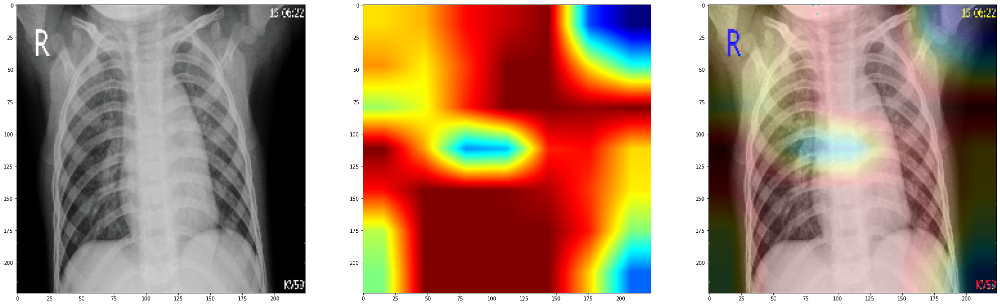

label_predicted PNEUMONIA  label PNEUMONIA pred_probs [[0.27275434 0.7272457 ]]


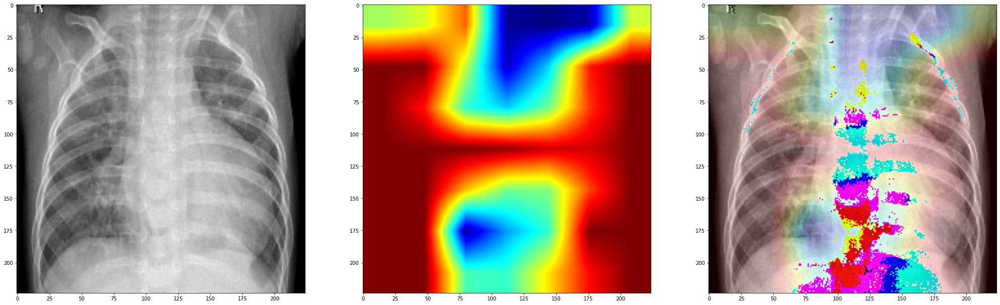

label_predicted PNEUMONIA  label PNEUMONIA pred_probs [[6.2530645e-04 9.9937469e-01]]


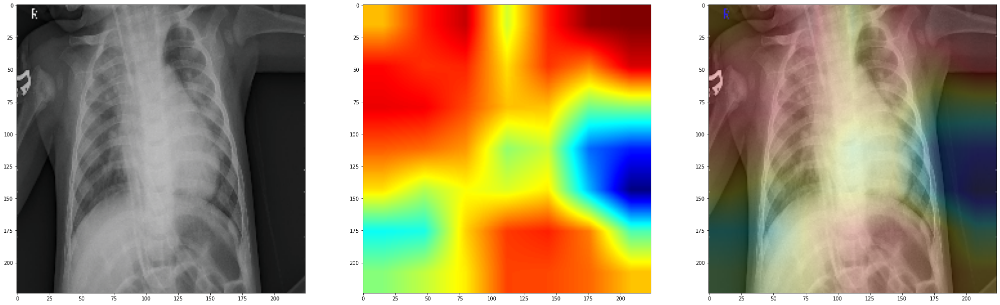

label_predicted PNEUMONIA  label PNEUMONIA pred_probs [[0.01485028 0.98514974]]


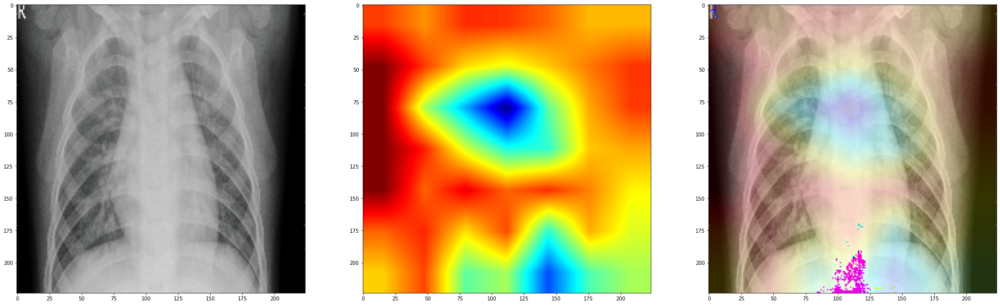

label_predicted NORMAL label NORMAL pred_probs [[0.8053725  0.19462755]]


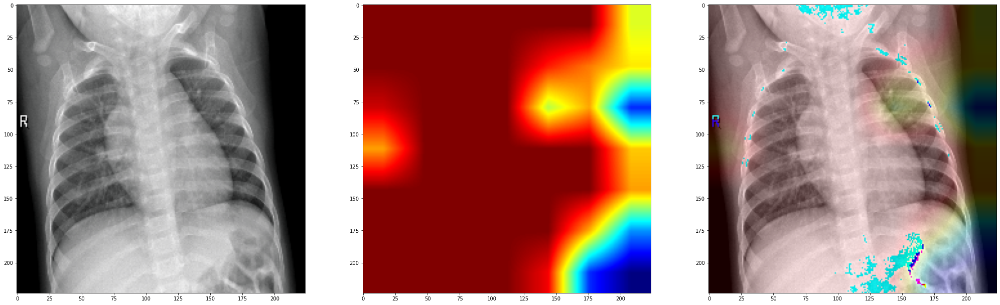

label_predicted PNEUMONIA  label PNEUMONIA pred_probs [[0.07268088 0.92731905]]


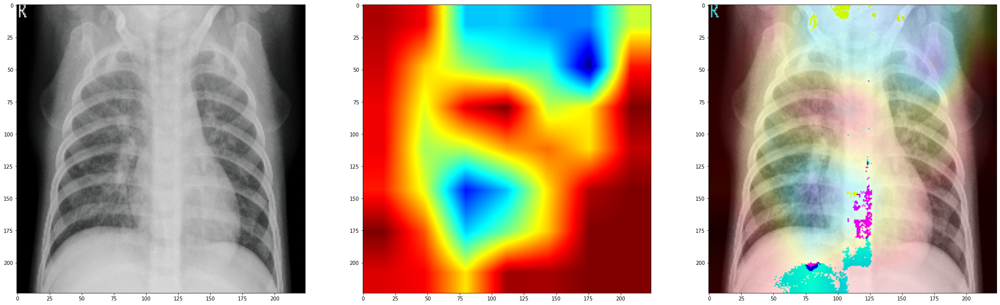

label_predicted NORMAL label PNEUMONIA pred_probs [[0.6970314  0.30296865]]


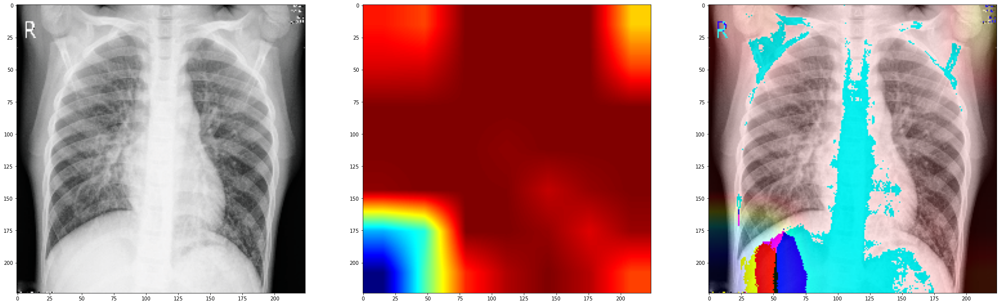

label_predicted PNEUMONIA  label PNEUMONIA pred_probs [[0.00389296 0.99610704]]


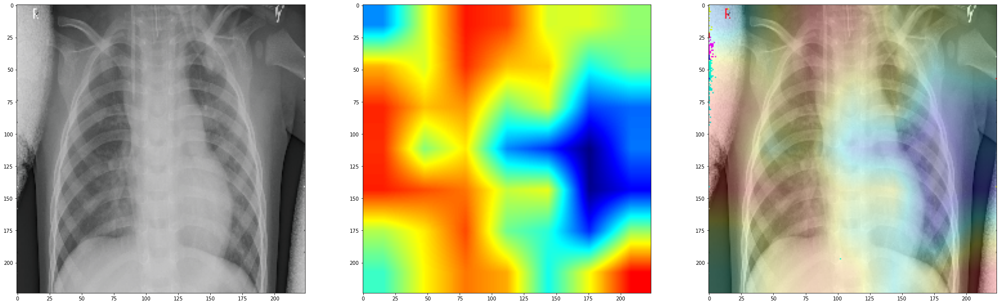

label_predicted PNEUMONIA  label PNEUMONIA pred_probs [[2.1740924e-04 9.9978262e-01]]


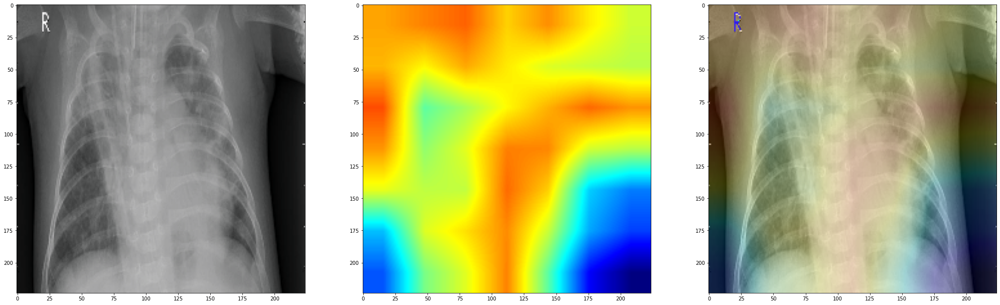

label_predicted PNEUMONIA  label PNEUMONIA pred_probs [[0.00278995 0.9972101 ]]


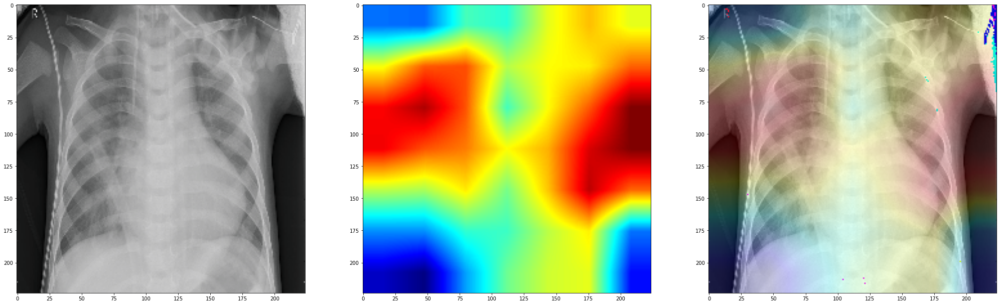

label_predicted PNEUMONIA  label PNEUMONIA pred_probs [[0.01197734 0.9880227 ]]


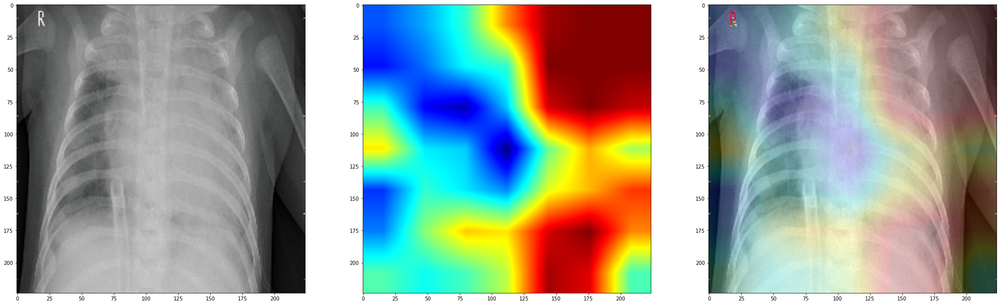

label_predicted PNEUMONIA  label PNEUMONIA pred_probs [[0.23254566 0.7674544 ]]


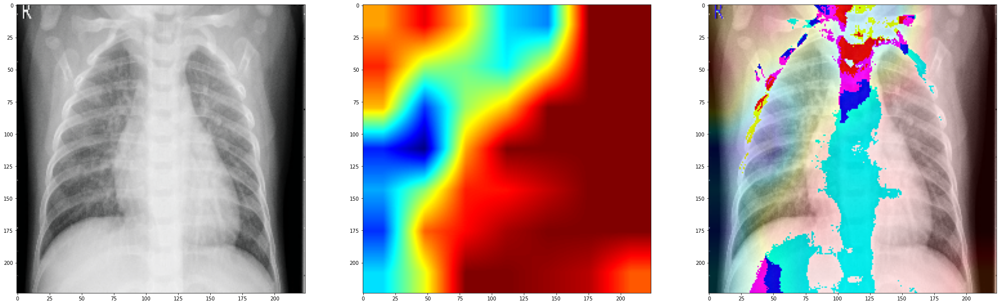

label_predicted NORMAL label NORMAL pred_probs [[0.94093263 0.05906741]]


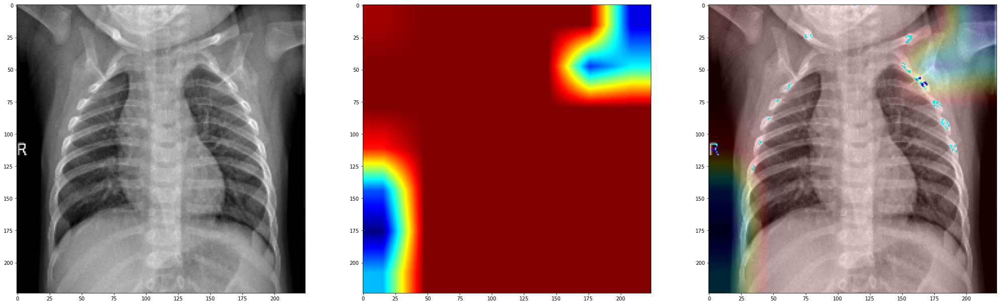

label_predicted PNEUMONIA  label PNEUMONIA pred_probs [[0.00156583 0.9984341 ]]


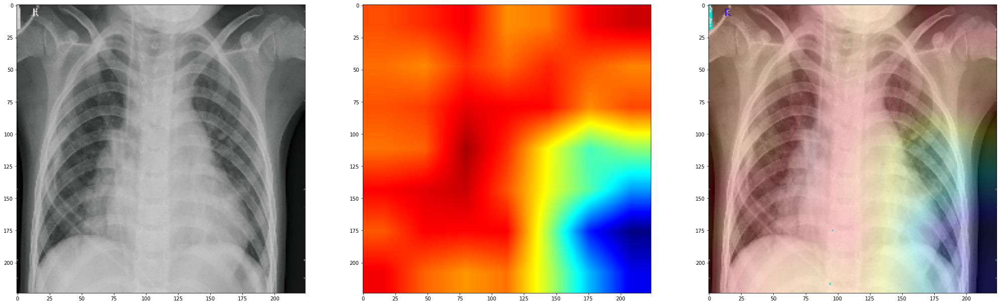

label_predicted PNEUMONIA  label PNEUMONIA pred_probs [[0.00355258 0.99644744]]


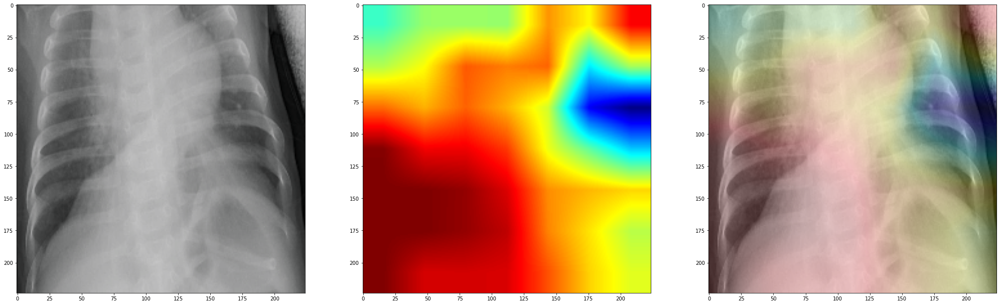

label_predicted PNEUMONIA  label PNEUMONIA pred_probs [[0.00167859 0.99832135]]


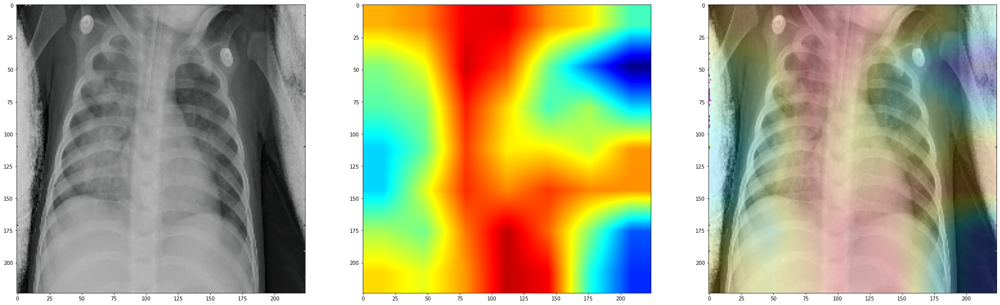

label_predicted PNEUMONIA  label PNEUMONIA pred_probs [[0.0092604 0.9907396]]


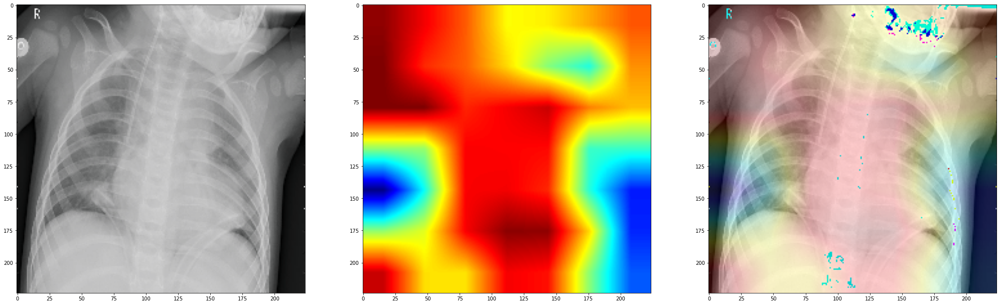

label_predicted PNEUMONIA  label PNEUMONIA pred_probs [[0.00195669 0.9980433 ]]


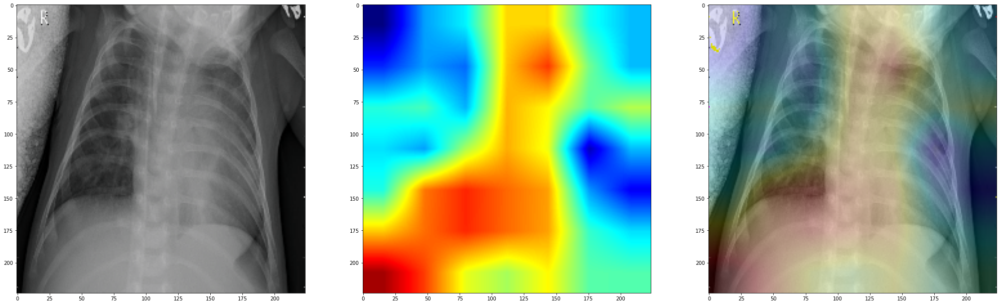

label_predicted NORMAL label NORMAL pred_probs [[0.98367614 0.01632384]]


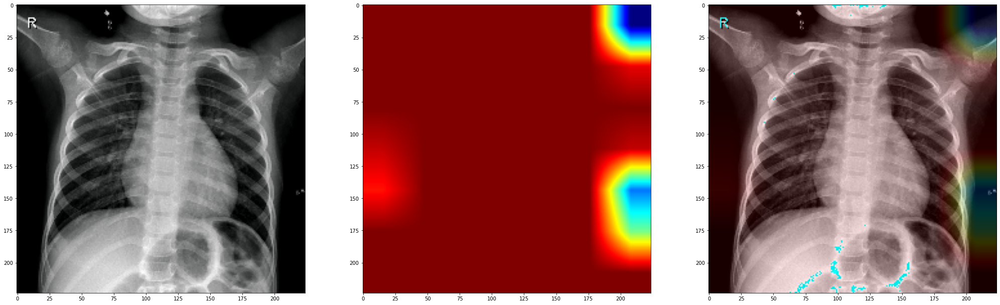

label_predicted NORMAL label NORMAL pred_probs [[0.94362456 0.0563755 ]]


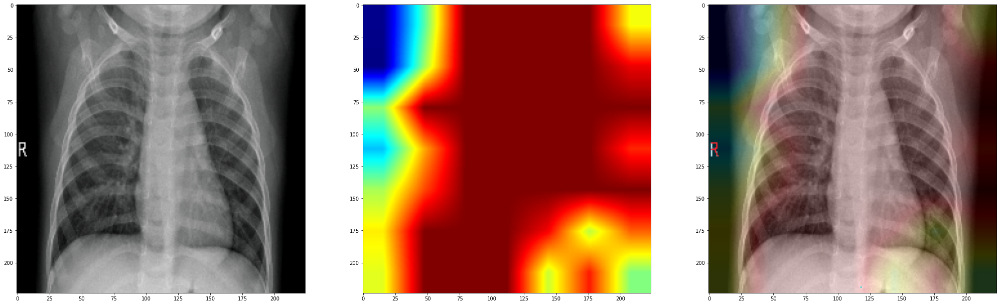

In [75]:
################################# CREATING GRADCAM
def undo_norm(image):
  npimg = image.squeeze(0).cpu().numpy()
  npimg = np.transpose(npimg, (1,2,0))
  npimg = ((npimg * [0.229, 0.224, 0.225]) + [0.485, 0.456, 0.406])
  return npimg

for k in range(len(dataset)-(len(dataset)-20)):

  
  #data_loader_gradcam = DataLoader(dataset[k], batch_size=1, shuffle=False)
  #image,label = data_loader_gradcam
  image = cv2.imread(dataset[k])
  image = preprocess_image(image)

  image = image.to(device)
  label = dataset[k].split('/')[-2]

  pred = model_classification1(image)
  _,preds = torch.max(pred, 1)

  pred_probs = torch.softmax(pred, dim=1).cpu().data.numpy()
  
  if preds.cpu().numpy()[0] == 1:
    label_predicted = 'PNEUMONIA '

  else:
    label_predicted = 'NORMAL'

  print('label_predicted',label_predicted,'label',label,'pred_probs',pred_probs)
  heatmap = get_gradcam(model_classification1,image,pred[0][1], size =224)


  image = undo_norm(image)
  image = (image*255).astype(np.uint8)
  size = 224
  image = cv2.resize(image,(size,size))

  heatmap = cv2.resize(heatmap.numpy(),(image.shape[1],image.shape[0]))
  heatmap = np.uint8(255*heatmap)
  heatmap = cv2.applyColorMap(heatmap,cv2.COLORMAP_JET)

  superimposed_img = np.uint8(heatmap * 0.2 + image)
  fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize = (35,20))
  ax1.imshow(image)
  ax2.imshow(heatmap)
  ax3.imshow(superimposed_img)

  plt.show()


